Basic imports and stuff

In [5]:
import os
import sys
import pandas as pd
import numpy as np



import open3d as o3d
import ultralytics

import glob

YOLO Segmentation-------------- TASK 1

In [6]:
import os
import numpy as np
from ultralytics import YOLO

image_folder = "KITTI-360_sample\\data_2d_raw\\2013_05_28_drive_0000_sync\\image_00\\data_rect\\"
mask_folder = "yolo_masks"
box_folder = "yolo_boxes"

model = YOLO("yolo11n-seg.pt")
os.makedirs(mask_folder, exist_ok=True)

for image_file in os.listdir(image_folder):
    frame_id = os.path.splitext(image_file)[0]
    image_path = os.path.join(image_folder, image_file)
    results = model.predict(source=image_path, classes=2)
    for res in results:
        # Save masks
        if res.masks is not None:
            masks = res.masks.data.cpu().numpy()
        else:
            masks = np.empty((0,))
        np.save(os.path.join(mask_folder, f"{frame_id}.npy"), masks)
        



image 1/1 c:\Users\Berk\Desktop\RWU\Lidar\KITTI-360_sample\data_2d_raw\2013_05_28_drive_0000_sync\image_00\data_rect\0000000100.png: 192x640 4 cars, 47.4ms
Speed: 1.0ms preprocess, 47.4ms inference, 2.9ms postprocess per image at shape (1, 3, 192, 640)

image 1/1 c:\Users\Berk\Desktop\RWU\Lidar\KITTI-360_sample\data_2d_raw\2013_05_28_drive_0000_sync\image_00\data_rect\0000000250.png: 192x640 3 cars, 47.8ms
Speed: 0.9ms preprocess, 47.8ms inference, 1.7ms postprocess per image at shape (1, 3, 192, 640)

image 1/1 c:\Users\Berk\Desktop\RWU\Lidar\KITTI-360_sample\data_2d_raw\2013_05_28_drive_0000_sync\image_00\data_rect\0000000360.png: 192x640 4 cars, 51.2ms
Speed: 1.0ms preprocess, 51.2ms inference, 2.2ms postprocess per image at shape (1, 3, 192, 640)

image 1/1 c:\Users\Berk\Desktop\RWU\Lidar\KITTI-360_sample\data_2d_raw\2013_05_28_drive_0000_sync\image_00\data_rect\0000000570.png: 192x640 (no detections), 47.8ms
Speed: 0.9ms preprocess, 47.8ms inference, 0.5ms postprocess per image a

Velodyne Data Visualization with Open3D------------ TASK 2

In [7]:
import os
import numpy as np
import open3d as o3d
## You have to change here to see the results for different frames- 1 #ĞĞĞ
root_dir = "KITTI-360_sample"
sequence = "2013_05_28_drive_0000_sync"
frameId = 100
# Frame ID

bin_path = os.path.join(
    root_dir, "data_3d_raw", sequence, "velodyne_points", "data", f"{frameId:010d}.bin"
)

if not os.path.exists(bin_path):
    raise FileNotFoundError(f"LiDAR .bin file not found: {bin_path}")


# Loading the LiDAR point cloud data. The shape will be (x,y,z,reflectance). Lecture Notes Chapter 8
points = np.fromfile(bin_path, dtype=np.float32).reshape(-1, 4)
xyz = points[:, :3]
reflectance = points[:, 3]
intensity = (reflectance - reflectance.min()) / (reflectance.ptp() + 1e-6)
grayscale = np.stack([intensity] * 3, axis=1)

#Visualizing the point cloud
pcd = o3d.geometry.PointCloud()
pcd.points = o3d.utility.Vector3dVector(xyz)
pcd.colors = o3d.utility.Vector3dVector(grayscale)
vis = o3d.visualization.Visualizer()
vis.create_window(window_name="KITTI-360 LiDAR Point Cloud", width=800, height=600)
opt = vis.get_render_option()
opt.background_color = np.asarray([1, 1, 1])
opt.line_width = 1.0
opt.point_size = 1.6
vis.add_geometry(pcd)
vis.run()
vis.destroy_window()


Visualization of the YOLO mask folder

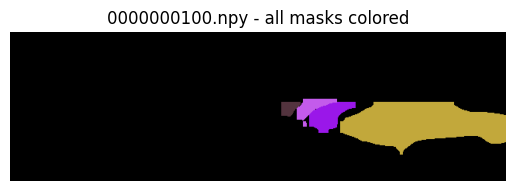

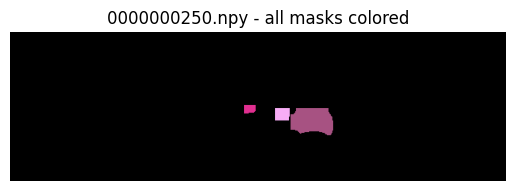

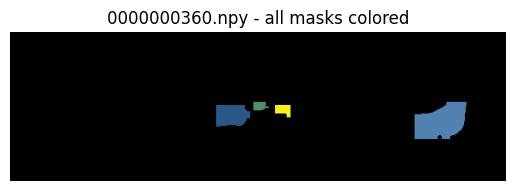

Skipping empty mask: 0000000570.npy


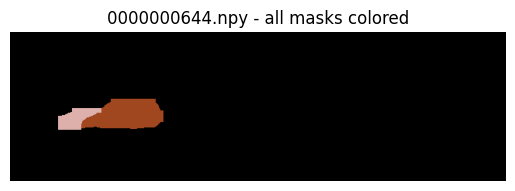

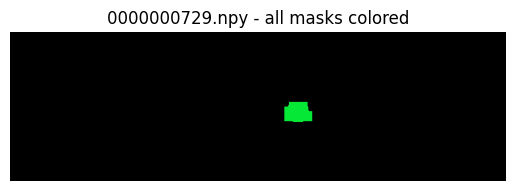

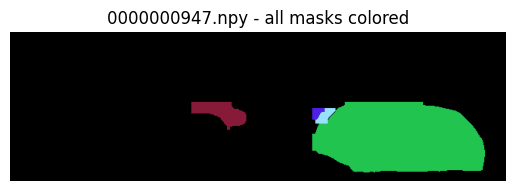

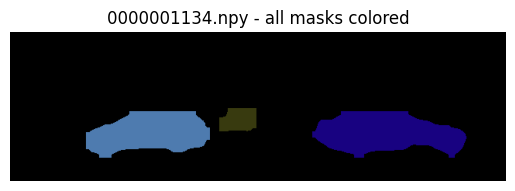

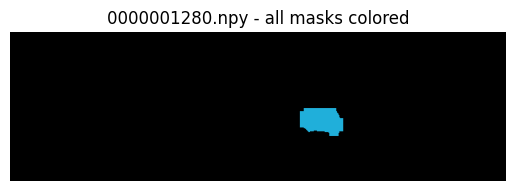

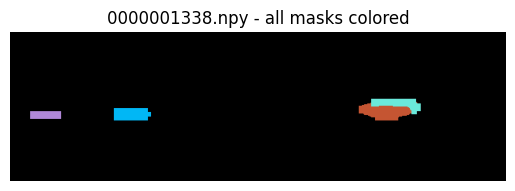

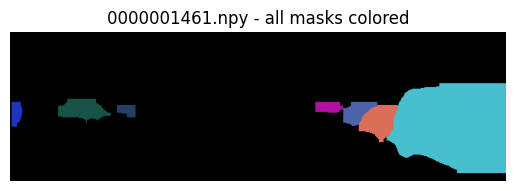

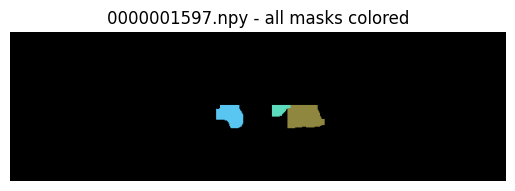

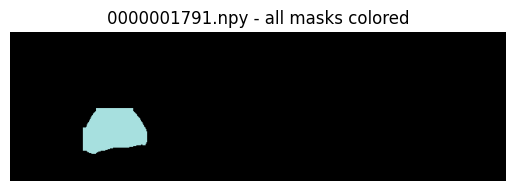

Skipping empty mask: 0000001866.npy


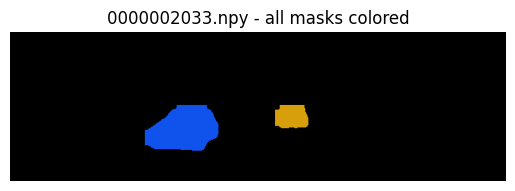

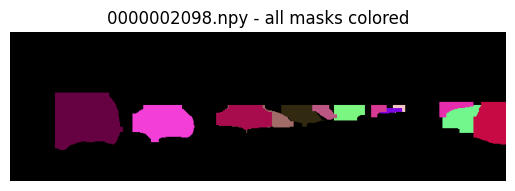

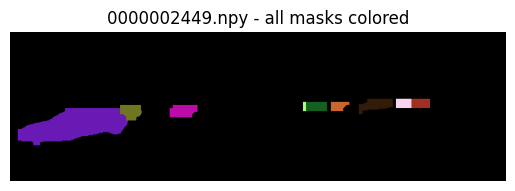

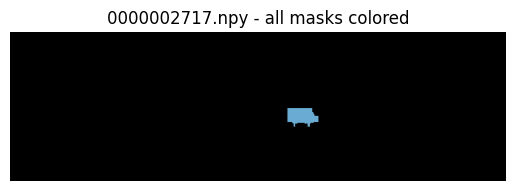

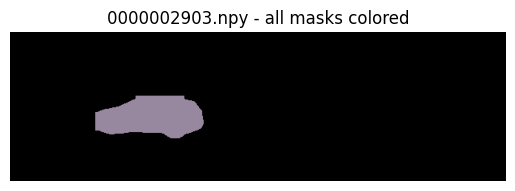

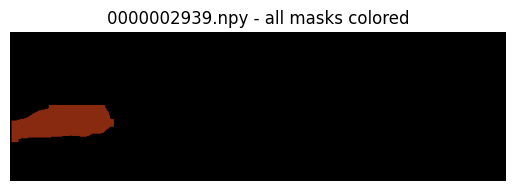

In [8]:
import matplotlib.pyplot as plt

mask_files = os.listdir(mask_folder)

for mask_file in mask_files:
    mask = np.load(os.path.join(mask_folder, mask_file))
    # Skip empty masks
    if mask.size == 0:
        print(f"Skipping empty mask: {mask_file}")
        continue
    if mask.ndim == 3:
        # Create an RGB image for visualization
        h, w = mask.shape[1], mask.shape[2]
        color_mask = np.zeros((h, w, 3), dtype=np.uint8)
        # Assign a unique color to each mask
        for i in range(mask.shape[0]):
            color = np.random.randint(0, 255, size=3)
            color_mask[mask[i] > 0] = color
        plt.imshow(color_mask)
        plt.title(f"{mask_file} - all masks colored")
        plt.axis('off')
        plt.show()
    else:
        plt.imshow(mask, cmap='gray')
        plt.title(mask_file)
        plt.axis('off')
        plt.show()
        

-----------Camera images with projected points----------- Task 3

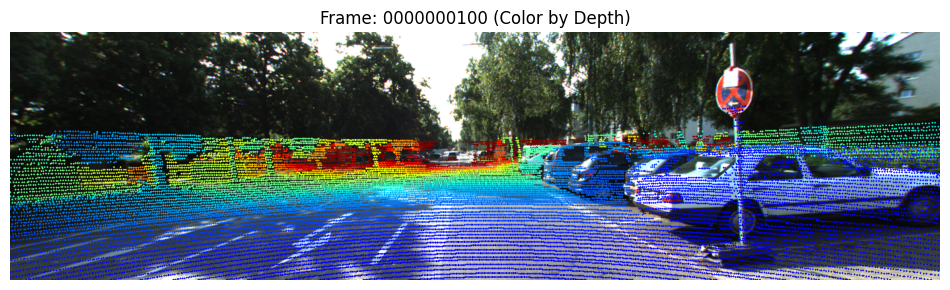

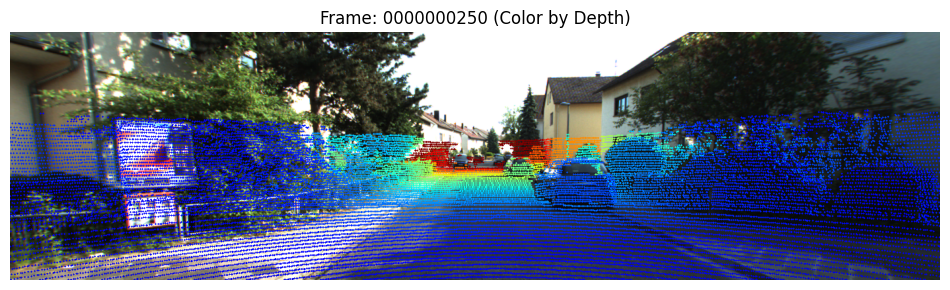

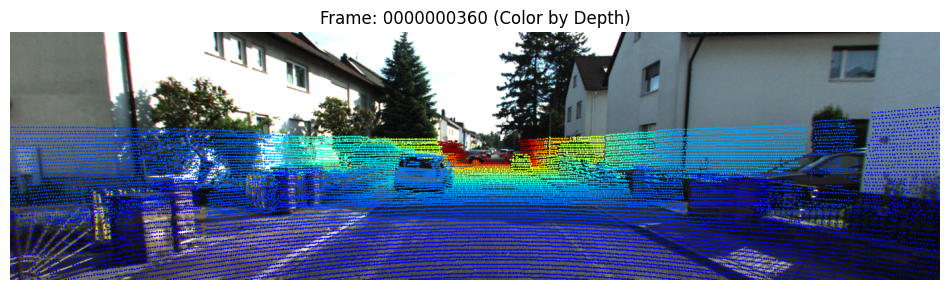

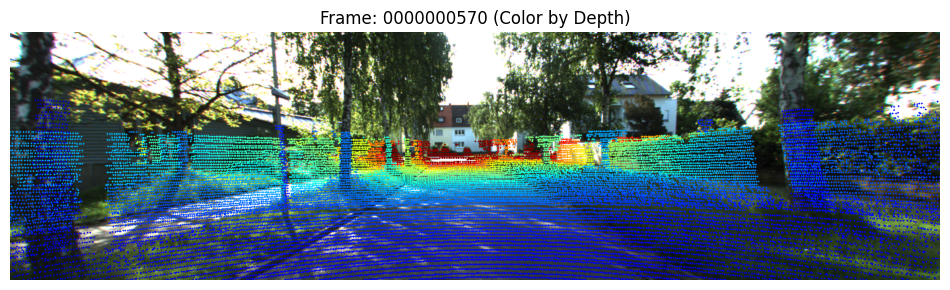

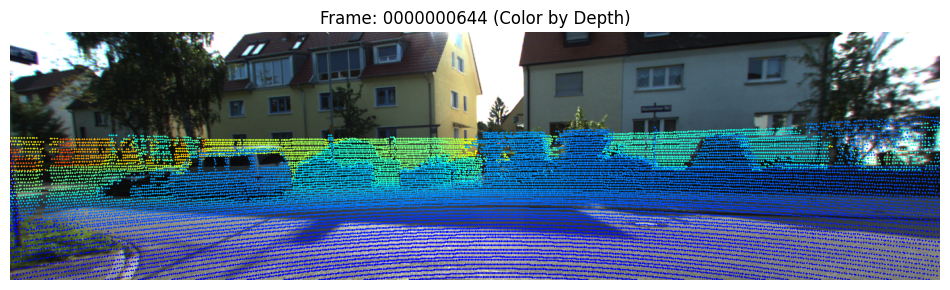

...

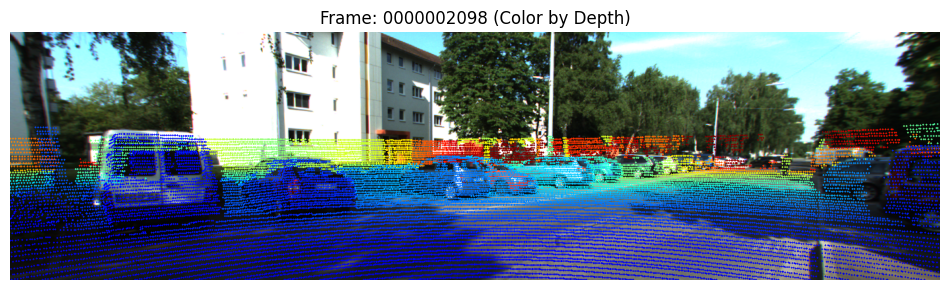

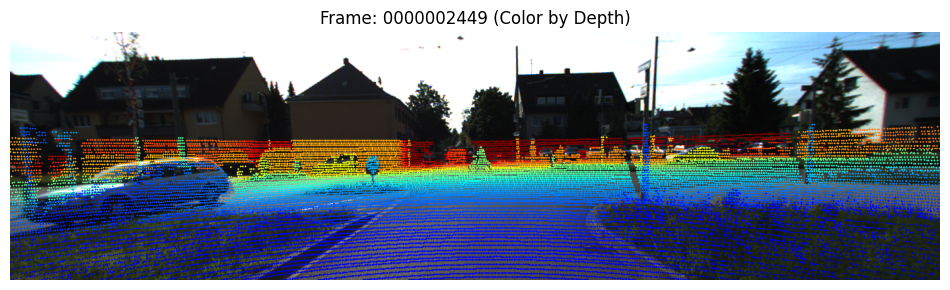

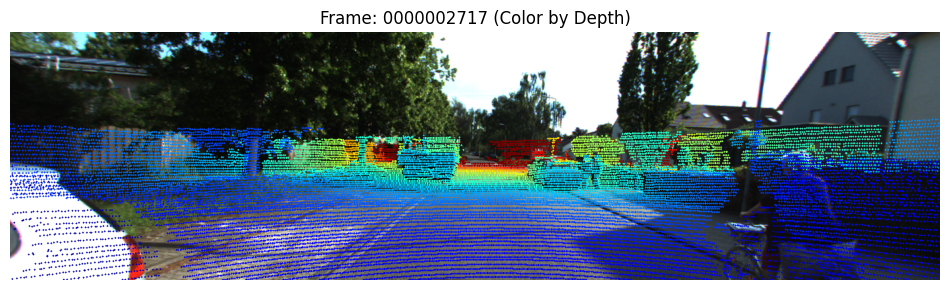

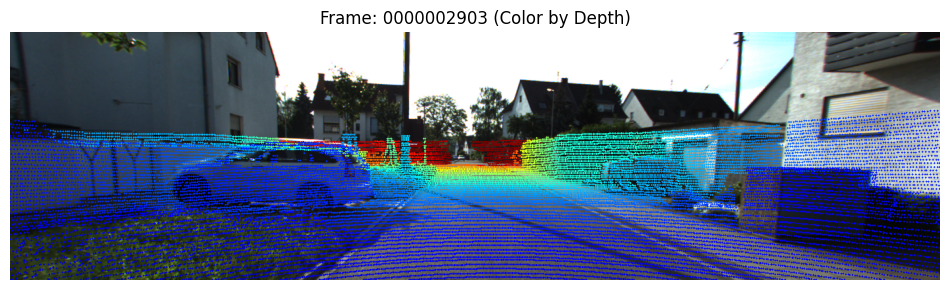

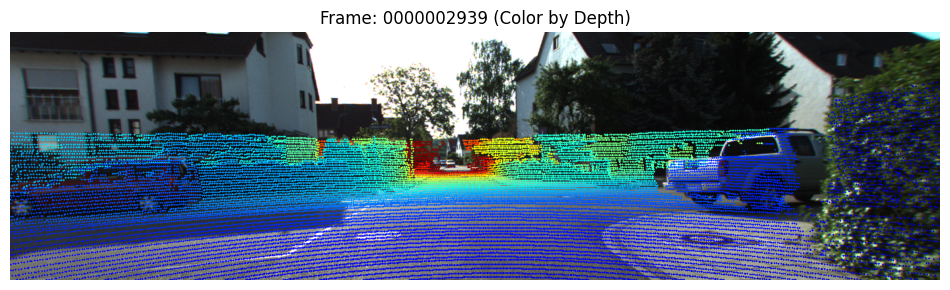

In [9]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt

use_colormap = True  

bin_dir = r"KITTI-360_sample\data_3d_raw\2013_05_28_drive_0000_sync\velodyne_points\data"
img_dir = r"KITTI-360_sample\data_2d_raw\2013_05_28_drive_0000_sync\image_00\data_rect"

#Calib matrix
Tr_velo_to_cam = np.array([
    [0.04307104361, -0.08829286498, 0.995162929, 0.8043914418],
    [-0.999004371, 0.007784614041, 0.04392796942, 0.2993489574],
    [-0.01162548558, -0.9960641394, -0.08786966659, -0.1770225824]
])
#Taking the inverse of the transformation matrix because cam2velo.txt is given in the opposite direction
Tr_velo_to_cam = np.vstack((Tr_velo_to_cam, [0, 0, 0, 1]))
Tr_cam_to_velo_inversed = np.linalg.inv(Tr_velo_to_cam)
P_rect_00 = np.array([
    [552.554261, 0.0,       682.049453, 0.0],
    [0.0,       552.554261, 238.769549, 0.0],
    [0.0,       0.0,        1.0,        0.0]
])

bin_files = sorted([f for f in os.listdir(bin_dir) if f.endswith(".bin")])
img_files = sorted([f for f in os.listdir(img_dir) if f.endswith(".png")])

for bin_file, img_file in zip(bin_files, img_files):
    # Load image
    image_path = os.path.join(img_dir, img_file)
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Load point cloud
    bin_path = os.path.join(bin_dir, bin_file)
    points = np.fromfile(bin_path, dtype=np.float32).reshape(-1, 4)
    
    # Process points and project to image
    points = points[points[:, 0] > 0]
    points_hom = np.hstack((points[:, :3], np.ones((points.shape[0], 1))))
    points_cam = (Tr_cam_to_velo_inversed @ points_hom.T).T
    points_cam = points_cam[points_cam[:, 2] > 0]

    points_2d = (P_rect_00 @ points_cam[:, :4].T).T
    points_2d[:, 0] /= points_2d[:, 2]
    points_2d[:, 1] /= points_2d[:, 2]
    u = points_2d[:, 0]
    v = points_2d[:, 1]

    h, w, _ = image.shape
    valid = (u >= 0) & (u < w) & (v >= 0) & (v < h)
    u = u[valid].astype(np.int32)
    v = v[valid].astype(np.int32)
    depth = points_cam[valid, 2]

    # Draw points
    if use_colormap:
        depth_norm = np.clip(depth / 50, 0, 1)
        colormap = plt.get_cmap('jet')
        colors = (colormap(depth_norm)[:, :3] * 255).astype(np.uint8)
        for x, y, color in zip(u, v, colors):
            cv2.circle(image, (x, y), 1, tuple(int(c) for c in color), -1)
    else:
        for x, y in zip(u, v):
            cv2.circle(image, (x, y), 1, (255, 0, 0), -1)

    # Show image for each frame
    plt.figure(figsize=(12, 6))
    plt.imshow(image)
    plt.title(f"Frame: {bin_file[:-4]} (Color by Depth)" if use_colormap else f"Frame: {bin_file[:-4]} (Red Points)")
    plt.axis('off')
    plt.show()
    


Visualization of the point cloud taht lies inside the masks

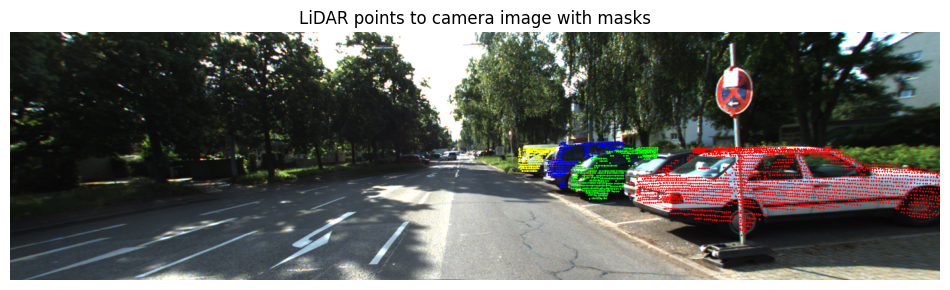

Saved: saved_subclouds\subcloud_000.bin
Saved: saved_subclouds\subcloud_001.bin
Saved: saved_subclouds\subcloud_002.bin
Saved: saved_subclouds\subcloud_003.bin


In [10]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# === Parameters ===
use_colormap = False  # Set to False for plain red dots

# === Paths ===
## You have to change here to see the results for different frames- 2 #ĞĞĞ
bin_path = "KITTI-360_sample\\data_3d_raw\\2013_05_28_drive_0000_sync\\velodyne_points\\data\\0000000100.bin"
image_path = "KITTI-360_sample\\data_2d_raw\\2013_05_28_drive_0000_sync\\image_00\\data_rect\\0000000100.png"
mask_path =                                                                      "yolo_masks\\0000000100.npy" 

# === Load image ===
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# === Load original point cloud ===
points_all = np.fromfile(bin_path, dtype=np.float32).reshape(-1, 4)  # (N0, 4)

# === Calibration matrices ===
Tr_velo_to_cam = np.array([
    [0.04307104361, -0.08829286498, 0.995162929, 0.8043914418],
    [-0.999004371, 0.007784614041, 0.04392796942, 0.2993489574],
    [-0.01162548558, -0.9960641394, -0.08786966659, -0.1770225824]
])
Tr_velo_to_cam = np.vstack((Tr_velo_to_cam, [0, 0, 0, 1]))
Tr_velo_to_cam = np.linalg.inv(Tr_velo_to_cam)

P_rect_00 = np.array([
    [552.554261, 0.0,       682.049453, 0.0],
    [0.0,       552.554261, 238.769549, 0.0],
    [0.0,       0.0,        1.0,        0.0]
])
#keeping the indices for original point cloud to save as subclouds.
indices = np.arange(points_all.shape[0])
mask_x_positive = points_all[:, 0] > 0
points = points_all[mask_x_positive]
indices = indices[mask_x_positive]
points_hom = np.hstack((points[:, :3], np.ones((points.shape[0], 1))))
points_cam = (Tr_velo_to_cam @ points_hom.T).T
mask_cam_visible = points_cam[:, 2] > 0
points_cam = points_cam[mask_cam_visible]
indices = indices[mask_cam_visible]
# Project to image plane
points_2d = (P_rect_00 @ points_cam[:, :4].T).T
points_2d[:, 0] /= points_2d[:, 2]
points_2d[:, 1] /= points_2d[:, 2]
u = points_2d[:, 0]
v = points_2d[:, 1]
h, w, _ = image.shape
valid = (u >= 0) & (u < w) & (v >= 0) & (v < h)
u = u[valid].astype(np.int32)
v = v[valid].astype(np.int32)
depth = points_cam[valid, 2]
indices_valid = indices[valid]
#saving the original points for subclouds
points_original = points_all[indices_valid]
points_cam_visible = points_cam[valid]
# === Load masks ===
mask = np.load(mask_path)  # shape (num_masks, height, width)
image_with_points = image.copy()
colors_rgb = [(255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0)]

subclouds = []
for i in range(mask.shape[0]):
    single_mask = mask[i]
    mask_bool = cv2.resize(single_mask.astype(np.uint8), (w, h))
    mask_bool = mask_bool.astype(bool)
    
    mask_hits = mask_bool[v, u]
    subcloud = points_original[mask_hits]
    subclouds.append(subcloud)
    
    u_masked = u[mask_hits]
    v_masked = v[mask_hits]
    depth_masked = depth[mask_hits]
    
    if use_colormap:
        depth_norm = np.clip(depth_masked / 50, 0, 1)
        colormap = plt.get_cmap('jet')
        colors = (colormap(depth_norm)[:, :3] * 255).astype(np.uint8)
        
        for x, y, color in zip(u_masked, v_masked, colors):
            cv2.circle(image_with_points, (x, y), 1, tuple(int(c) for c in color), -1)
    else:
        color = colors_rgb[i % len(colors_rgb)]
        for x, y in zip(u_masked, v_masked):
            cv2.circle(image_with_points, (x, y), 1, color, -1)

plt.figure(figsize=(12, 6))
plt.imshow(image_with_points)
plt.title("LiDAR points to camera image with masks")
plt.axis('off')
plt.show()

import os

output_dir = "saved_subclouds"
os.makedirs(output_dir, exist_ok=True)

for i, cloud in enumerate(subclouds):
    if cloud.shape[1] == 4:
        cloud_to_save = cloud
    else:
        reflectance = np.zeros((cloud.shape[0], 1), dtype=np.float32)
        cloud_to_save = np.hstack((cloud[:, :3], reflectance))

    output_path = os.path.join(output_dir, f"subcloud_{i:03d}.bin")
    cloud_to_save.astype(np.float32).tofile(output_path)
    print(f"Saved: {output_path}")



I defined colors because with random colors I can get same colors so I just created 15 different colors.

In [11]:
# Define 15 visually distinct RGB colors (in [0, 1] range)
predefined_colors = [
    [1, 0, 0],       # Red
    [0, 1, 0],       # Green
    [0, 0, 1],       # Blue
    [1, 1, 0],       # Yellow
    [1, 0, 1],       # Magenta
    [0, 1, 1],       # Cyan
    [1, 0.5, 0],     # Orange
    [0.6, 0.4, 0.8], # Purple
    [0.5, 0.5, 0.5], # Gray
    [0.8, 0.2, 0.2], # Dark Red
    [0.2, 0.8, 0.2], # Dark Green
    [0.2, 0.2, 0.8], # Dark Blue
    [0.6, 0.6, 0],   # Olive
    [0.6, 0, 0.6],   # Plum
    [0, 0.6, 0.6],   # Teal
]

Visualization of the subcloud points

In [12]:
import open3d as o3d
import numpy as np
import glob
import os

def load_kitti_bin(bin_path):
    points = np.fromfile(bin_path, dtype=np.float32).reshape(-1, 4)
    return points[:, :3]  # Just xyz

# Load all subclouds
bin_files = sorted(glob.glob("saved_subclouds/*.bin"))
geometries = []

for i, file in enumerate(bin_files):
    points = load_kitti_bin(file)
    pcd = o3d.geometry.PointCloud()
    pcd.points = o3d.utility.Vector3dVector(points)
    
    color = predefined_colors[i % len(predefined_colors)]  # Loop if > 15
    pcd.paint_uniform_color(color)
    
    geometries.append(pcd)

# Show all point clouds together
#o3d.visualization.draw_geometries(geometries)


Our BBoxes.json file is given in the coordinate space of cam0. So I did the same thing I did to tranform my mask subclod points.

In [13]:
def transform_bbox_corners_cam_to_velo(corners_cam, Tr_velo_to_cam, offset=(0.3, +0.5, -1)): #X, Y, X offsetler
    Tr_cam_to_velo = np.linalg.inv(Tr_velo_to_cam)
    corners_cam_hom = np.hstack((corners_cam, np.ones((8, 1))))
    corners_velo_hom = (Tr_cam_to_velo @ corners_cam_hom.T).T
    corners_velo = corners_velo_hom[:, :3]
    corners_velo += np.array(offset) 
    return corners_velo


3D visualizing

In [14]:
import json
# --------- Load BBoxes from JSON ---------
def load_bboxes_from_json(json_path):
    with open(json_path, 'r') as f:
        data = json.load(f)

    boxes = []
    for obj in data:
        corners = np.array(obj["corners_cam0"], dtype=np.float32)
        boxes.append(corners)

    return boxes

# --------- Create Open3D Lineset from Corners ---------
def create_bbox_lineset(corners, color=[1, 0, 0]):
    lines = [
         [0, 1], [1, 2], [2, 3], [3, 0],  # Bottom face
        [4, 5], [5, 6], [6, 7], [7, 4],  # Top face
        [0, 4], [1, 5], [2, 6], [3, 7]   # Vertical edges
    ]
    line_set = o3d.geometry.LineSet()
    line_set.points = o3d.utility.Vector3dVector(corners)
    line_set.lines = o3d.utility.Vector2iVector(lines)
    line_set.colors = o3d.utility.Vector3dVector([color] * len(lines))
    return line_set

# --------- Load and Visualize Subclouds + BBoxes ---------
## You have to change here to see the results for different frames- 3 #ĞĞĞ
frame_id = 100
json_path = f"KITTI-360_sample/bboxes_3D_cam0/BBoxes_{frame_id}.json"

# Load bounding boxes
bboxes_cam = load_bboxes_from_json(json_path)

# Define Tr_velo_to_cam manually or load it from KITTI calib file
# Example (dummy values — replace with actual calib matrix):
Tr_velo_to_cam = np.array([
    [7.215377e-03, -9.999714e-01, -2.035826e-03, -3.395242e-02],
    [1.046640e-02, 2.053448e-03, -9.998621e-01, -7.881130e-02],
    [9.999361e-01, 7.126999e-03, 1.048359e-02, -2.745884e-01],
    [0.0, 0.0, 0.0, 1.0]
])

# Transform bounding boxes from cam0 to velodyne
bboxes_velo = [transform_bbox_corners_cam_to_velo(bbox, Tr_velo_to_cam) for bbox in bboxes_cam]

# Load subclouds
def load_kitti_bin(# Load subclouds
bin_path):
    points = np.fromfile(bin_path, dtype=np.float32).reshape(-1, 4)
    return points[:, :3]

def random_color():
    return np.random.rand(3)

geometries = []

# Match all "subcloud_*.bin" files
bin_files = sorted(glob.glob("saved_subclouds/subcloud_*.bin"))

for file in bin_files:
    points = load_kitti_bin(file)
    if points.shape[0] == 0:
        print(f"Skipped empty file: {file}")
        continue
    
    pcd = o3d.geometry.PointCloud()
    pcd.points = o3d.utility.Vector3dVector(points)
    pcd.paint_uniform_color(random_color())
    geometries.append(pcd)

# Add transformed bounding boxes
for bbox in bboxes_velo:
    line_set = create_bbox_lineset(bbox)
    geometries.append(line_set)

# Visualize
vis = o3d.visualization.Visualizer()
vis.create_window(window_name=f"Frame {frame_id} with Subclouds + BBoxes", width=1000, height=800)

opt = vis.get_render_option()
opt.background_color = np.asarray([0, 0, 0])  # Set background to black
opt.point_size = 3.0


for geom in geometries:
    vis.add_geometry(geom)

vis.add_geometry(o3d.geometry.TriangleMesh.create_coordinate_frame(size=1.0))

vis.run()
vis.destroy_window()

Evaluation of the code

In [15]:
import open3d as o3d
import numpy as np
import json
import glob
import os

def load_bboxes_from_json(json_path):
    with open(json_path, 'r') as f:
        data = json.load(f)
    boxes = []
    indices = []
    for obj in data:
        corners = np.array(obj["corners_cam0"], dtype=np.float32)
        boxes.append(corners)
        indices.append(obj["index"])
    return boxes, indices

def load_kitti_bin(bin_path):
    points = np.fromfile(bin_path, dtype=np.float32).reshape(-1, 4)
    return points[:, :3]

def get_points_inside_bbox(points, bbox_corners):
    obb = o3d.geometry.OrientedBoundingBox.create_from_points(
        o3d.utility.Vector3dVector(bbox_corners)
    )
    indices = obb.get_point_indices_within_bounding_box(o3d.utility.Vector3dVector(points))
    return indices

# ----------- Main Evaluation ------------
# You have to change here to see the results for different frames- 4 #ĞĞĞ
frame_id = 100  
json_path = f"KITTI-360_sample/bboxes_3D_cam0/BBoxes_{frame_id}.json"
bin_files = sorted(glob.glob("saved_subclouds/subcloud_*.bin"))

# Load and transform bboxes to Velodyne space
bboxes_cam, bbox_indices = load_bboxes_from_json(json_path)

Tr_velo_to_cam = np.array([
    [7.215377e-03, -9.999714e-01, -2.035826e-03, -3.395242e-02],
    [1.046640e-02, 2.053448e-03, -9.998621e-01, -7.881130e-02],
    [9.999361e-01, 7.126999e-03, 1.048359e-02, -2.745884e-01],
    [0.0, 0.0, 0.0, 1.0]
])

bboxes_velo = [transform_bbox_corners_cam_to_velo(bbox, Tr_velo_to_cam) for bbox in bboxes_cam]

for file in bin_files:
    subcloud = load_kitti_bin(file)
    if subcloud.shape[0] == 0:
        continue

    best_match_idx = -1
    max_inside = 0

    for i, bbox in enumerate(bboxes_velo):
        indices = get_points_inside_bbox(subcloud, bbox)
        num_inside = len(indices)

        if num_inside > max_inside:
            max_inside = num_inside
            best_match_idx = i

    ratio = max_inside / subcloud.shape[0]

    print(f"\nEvaluating the car_{os.path.basename(file)}:")
    if best_match_idx != -1:
        print(f"Best match: BBox index: {bbox_indices[best_match_idx]})")
    else:
        print("No valid bounding box found.")
    print(f"Points inside: {max_inside} / {subcloud.shape[0]} ({ratio:.2%})")

    if ratio > 0.5:
        print("Result: Good match")
    else:
        print("Result: Bad match")



Evaluating the car_subcloud_000.bin:
Best match: BBox index: 218)
Points inside: 2190 / 2793 (78.41%)
Result: Good match

Evaluating the car_subcloud_001.bin:
Best match: BBox index: 216)
Points inside: 393 / 630 (62.38%)
Result: Good match

Evaluating the car_subcloud_002.bin:
Best match: BBox index: 215)
Points inside: 263 / 338 (77.81%)
Result: Good match

Evaluating the car_subcloud_003.bin:
Best match: BBox index: 210)
Points inside: 54 / 229 (23.58%)
Result: Bad match
